In [1]:
import os
import torch
import pandas as pd
import scanpy as sc
from GraphST.GraphST import GraphST
import shutil
from functions_graphST import n_cluster_loop

In [2]:
# Run device, by default, the package is implemented on 'cpu'. We recommend using GPU.
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')

# the location of R, which is necessary for mclust algorithm. Please replace the path below with local R installation path
os.environ["R_HOME"] = "/Library/Frameworks/R.framework/Resources"

In [3]:
data_path = '../../../datashare/PDAC/visium_PDAC/'
sample_directory = 'Visium_FFPE_V43T08-041_A'

input = os.path.join(data_path, sample_directory, 'outs')

# tissue_positions.csv --> tissue_positions_list.csv
shutil.copy(os.path.join(input, 'spatial', 'tissue_positions.csv'), os.path.join(input, 'spatial', 'tissue_positions_list.csv'))

adata = sc.read_visium(input, count_file='filtered_feature_bc_matrix.h5', load_images=True)
adata.var_names_make_unique()

/Users/memarchand/Documents/Spatial-Transcriptomics/PDAC/clustering/envrt_graphST/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata.obsm['spatial'] = adata.obsm['spatial'].astype('float64')

## Training using gene expression matrix and spatial location information

#### Steps of log transformation and normalization using Scanpy are included

#### Note: learned representation stored in adata.obsm['emb'] (spots x highly variables genes = Hs)

In [5]:
# define model
model = GraphST.GraphST(adata, device=device)

# train model
adata = model.train()

Begin to train ST data...


100%|██████████| 600/600 [02:06<00:00,  4.76it/s]


Optimization finished for ST data!


## Spatial Clustering

#### Note: to optimize the testing of louvain and leiden methods, the GraphST/GraphST/utils.py has been modified (avoid recalculating all the resolutions multiples times when testing differents number of clusters)

fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%


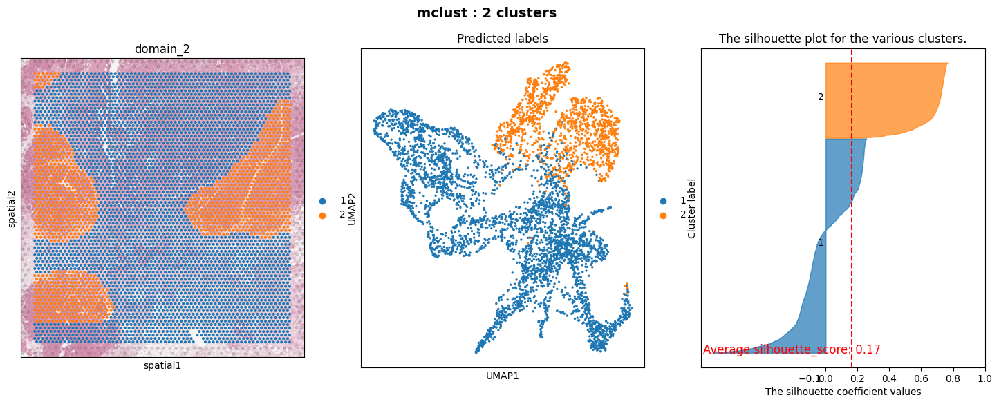

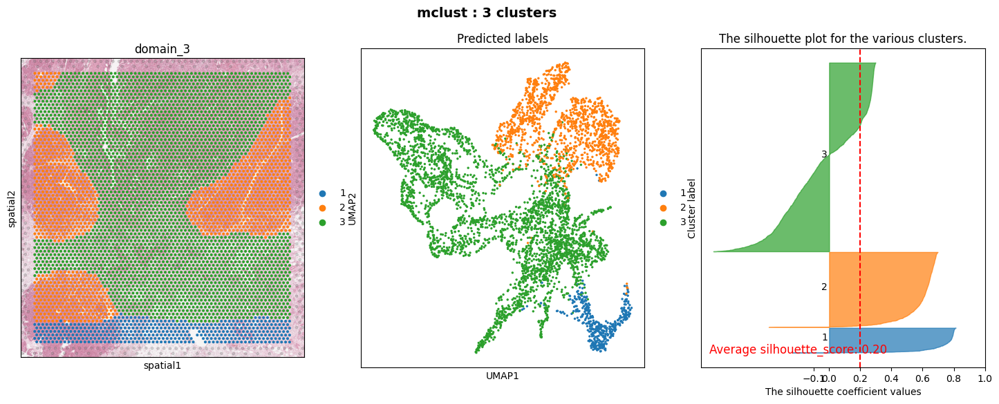

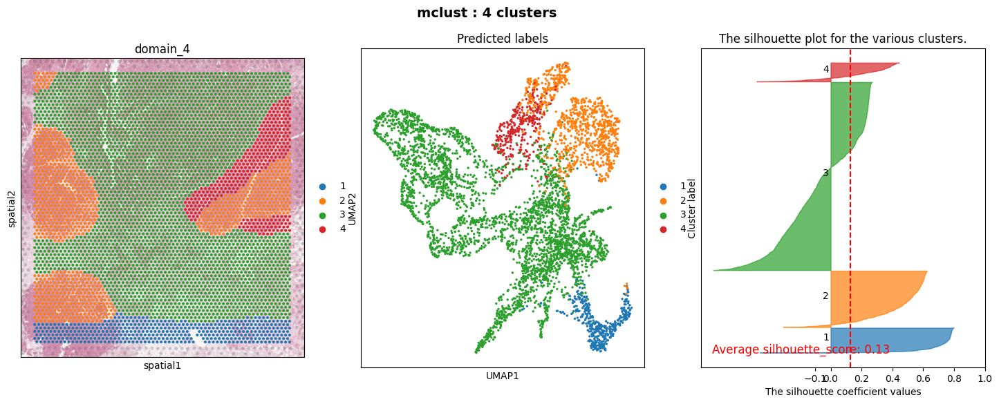

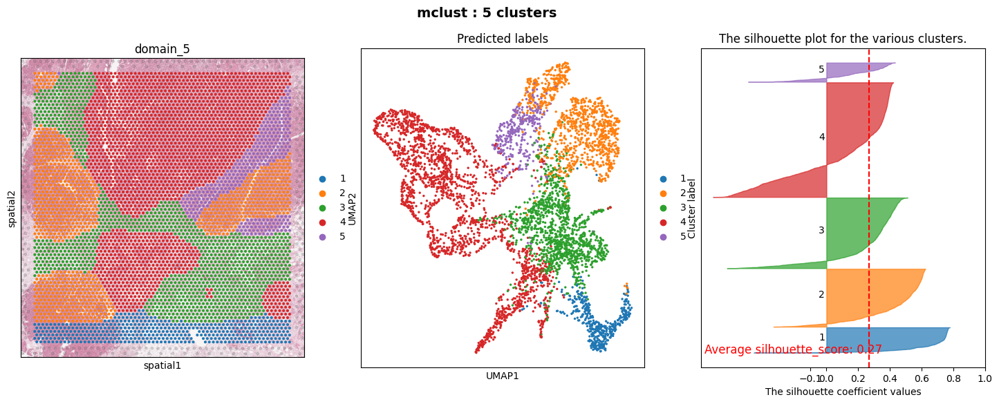

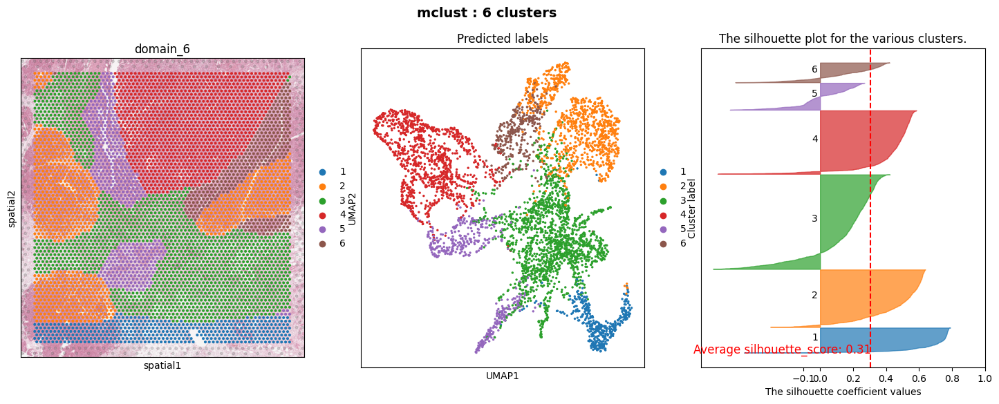

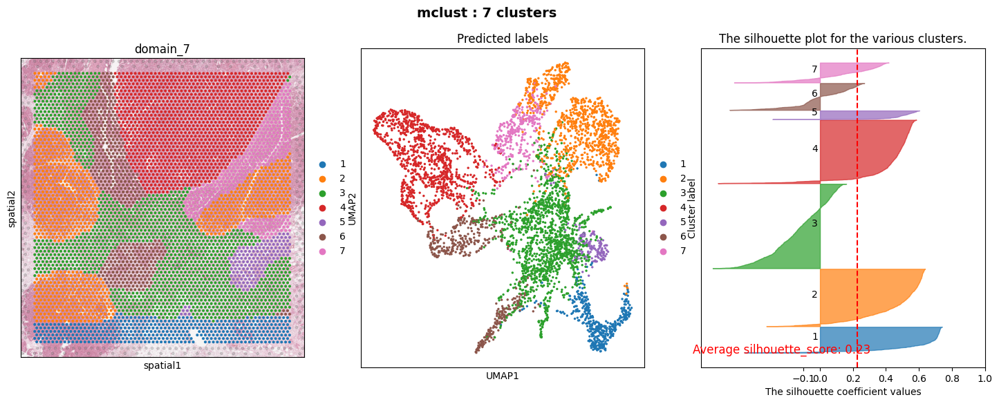

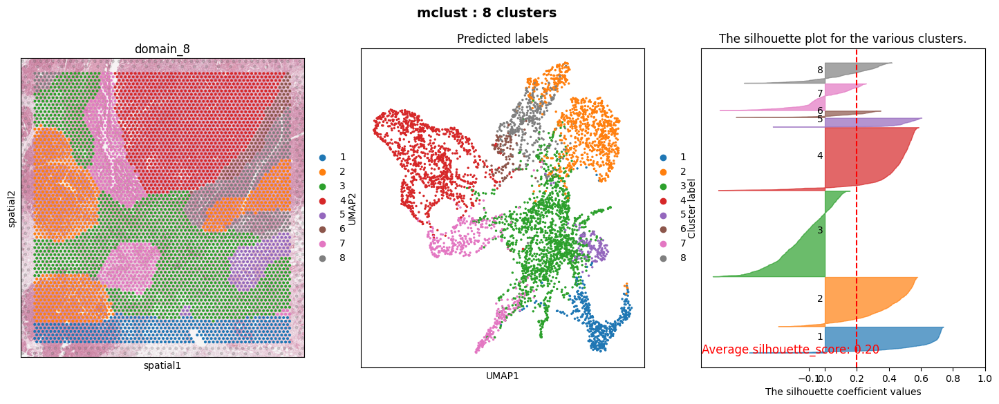

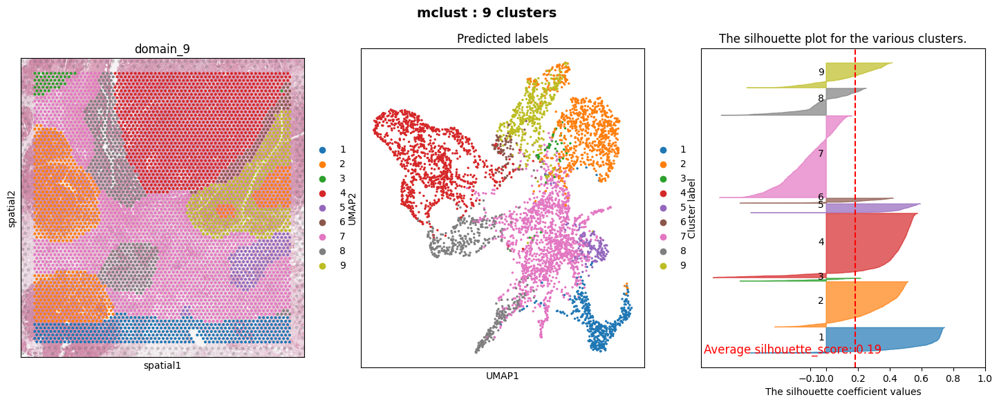

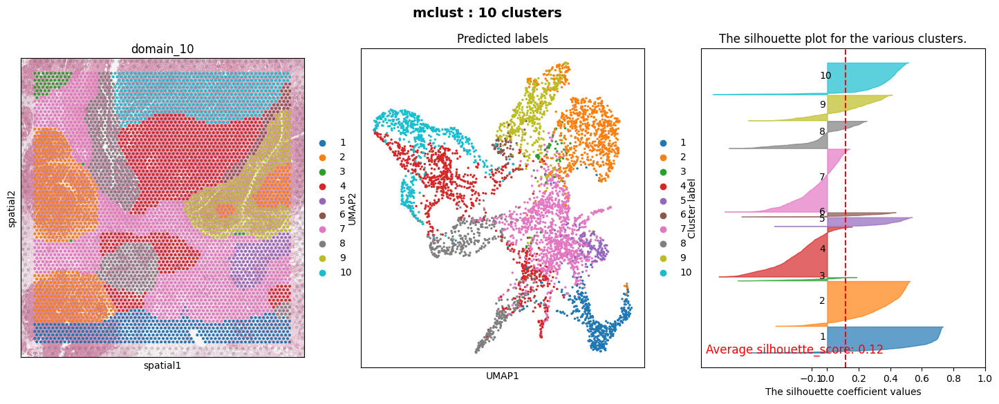

Searching resolution...
resolution=1.4899999999999993, cluster number=16
resolution=1.4799999999999993, cluster number=16
resolution=1.4699999999999993, cluster number=16
resolution=1.4599999999999995, cluster number=16
resolution=1.4499999999999995, cluster number=16
resolution=1.4399999999999995, cluster number=16
resolution=1.4299999999999995, cluster number=16
resolution=1.4199999999999995, cluster number=16
resolution=1.4099999999999995, cluster number=16
resolution=1.3999999999999995, cluster number=16
resolution=1.3899999999999995, cluster number=16
resolution=1.3799999999999994, cluster number=15
resolution=1.3699999999999994, cluster number=16
resolution=1.3599999999999994, cluster number=16
resolution=1.3499999999999994, cluster number=16
resolution=1.3399999999999994, cluster number=16
resolution=1.3299999999999994, cluster number=16
resolution=1.3199999999999994, cluster number=16
resolution=1.3099999999999994, cluster number=16
resolution=1.2999999999999994, cluster number

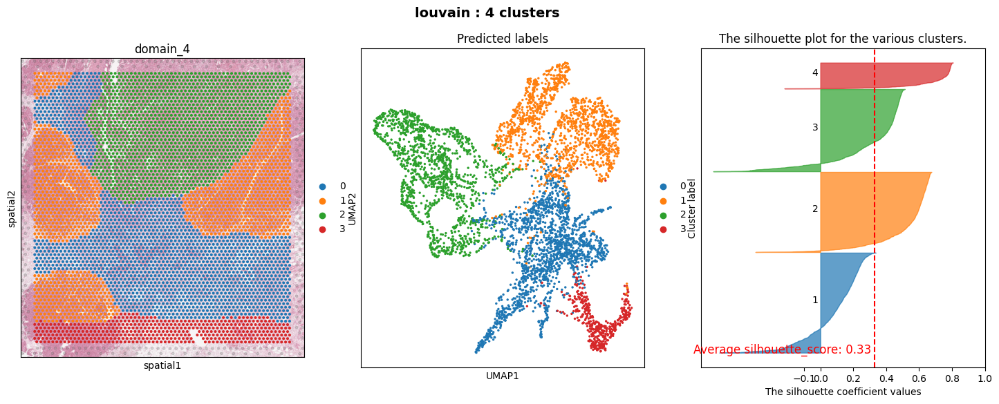

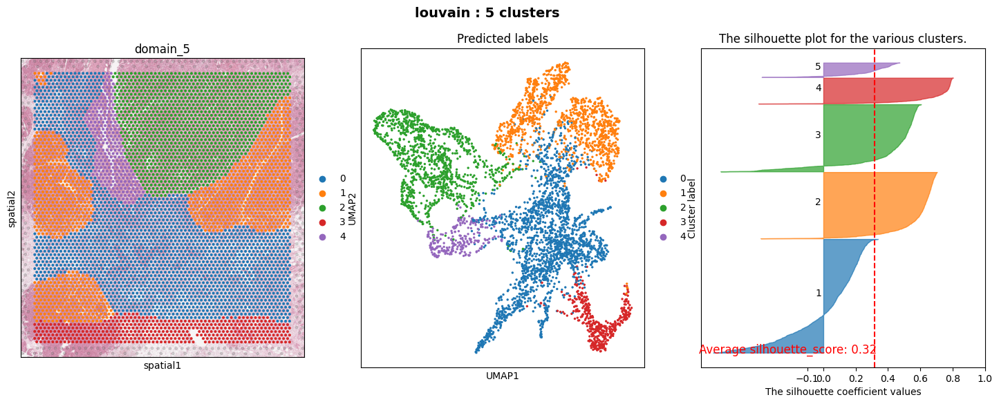

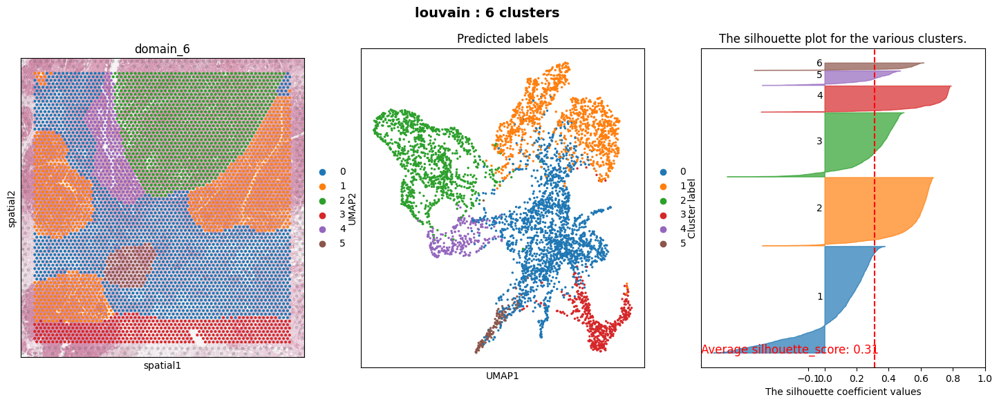

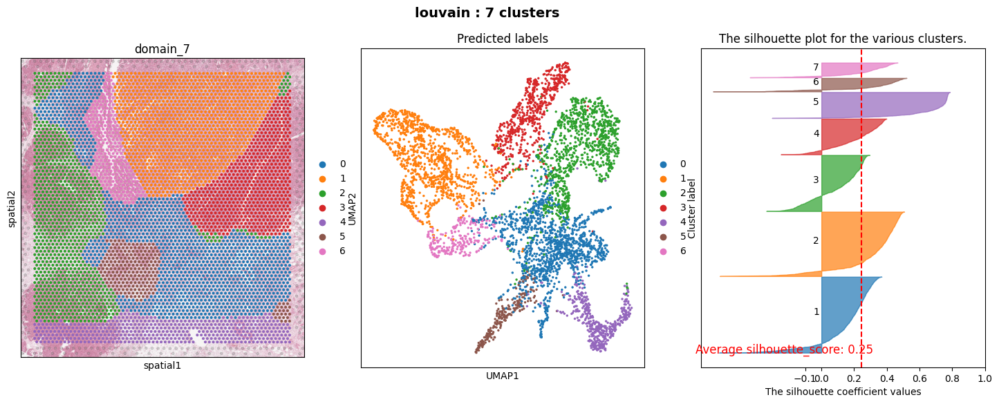

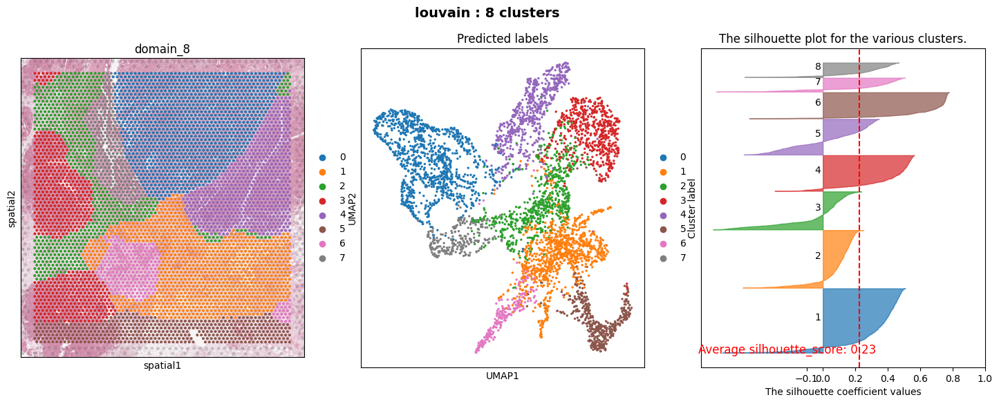

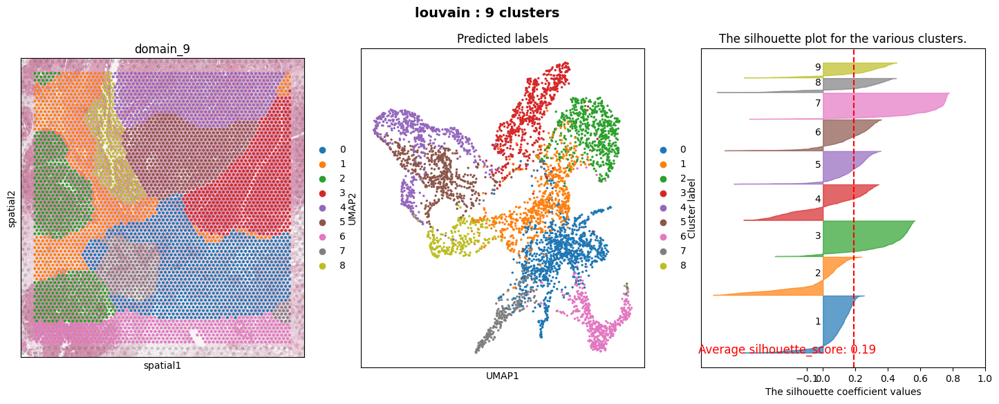

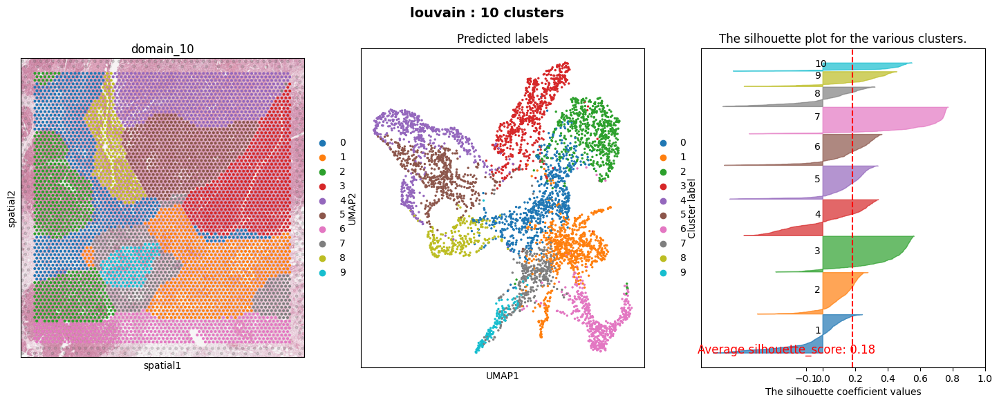

Searching resolution...
resolution=1.4899999999999993, cluster number=22
resolution=1.4799999999999993, cluster number=22
resolution=1.4699999999999993, cluster number=23
resolution=1.4599999999999995, cluster number=22
resolution=1.4499999999999995, cluster number=22
resolution=1.4399999999999995, cluster number=22
resolution=1.4299999999999995, cluster number=21
resolution=1.4199999999999995, cluster number=21
resolution=1.4099999999999995, cluster number=22
resolution=1.3999999999999995, cluster number=23
resolution=1.3899999999999995, cluster number=22
resolution=1.3799999999999994, cluster number=22
resolution=1.3699999999999994, cluster number=22
resolution=1.3599999999999994, cluster number=21
resolution=1.3499999999999994, cluster number=21
resolution=1.3399999999999994, cluster number=21
resolution=1.3299999999999994, cluster number=20
resolution=1.3199999999999994, cluster number=20
resolution=1.3099999999999994, cluster number=20
resolution=1.2999999999999994, cluster number

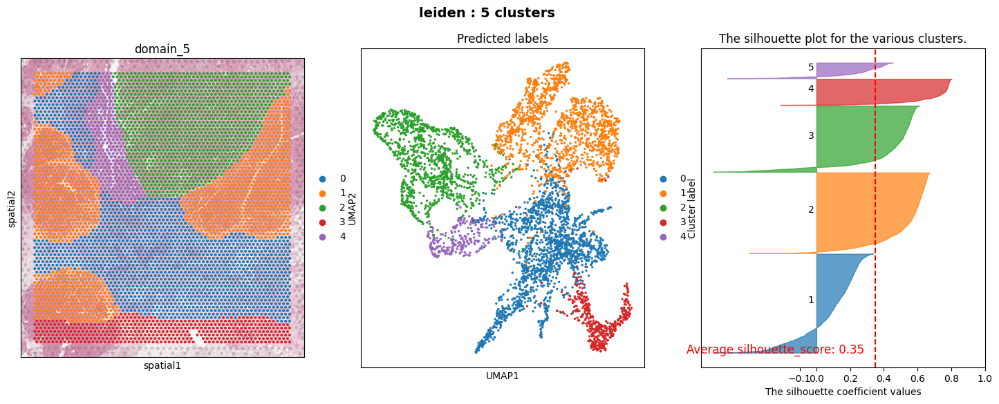

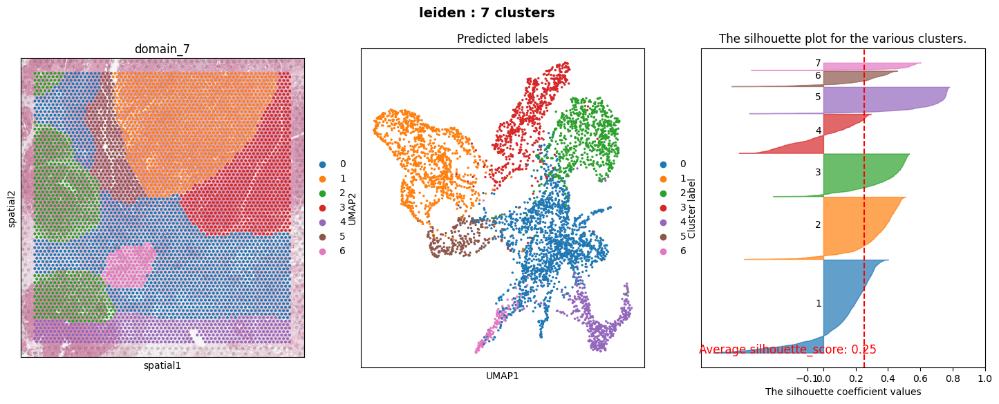

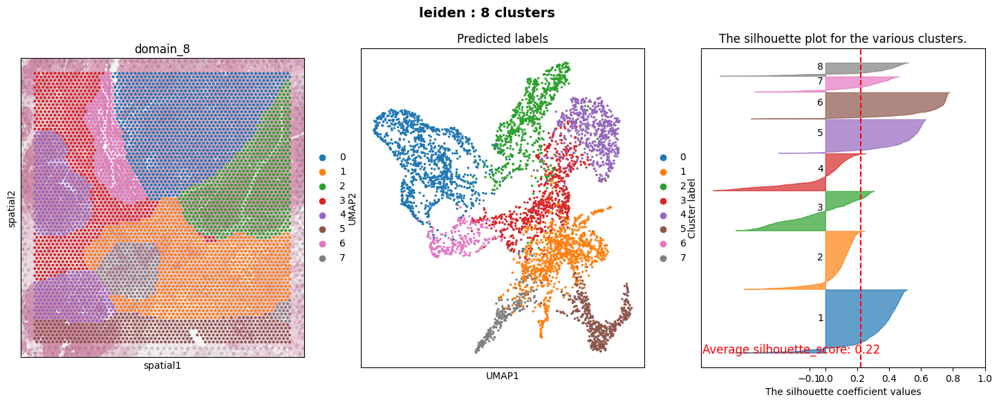

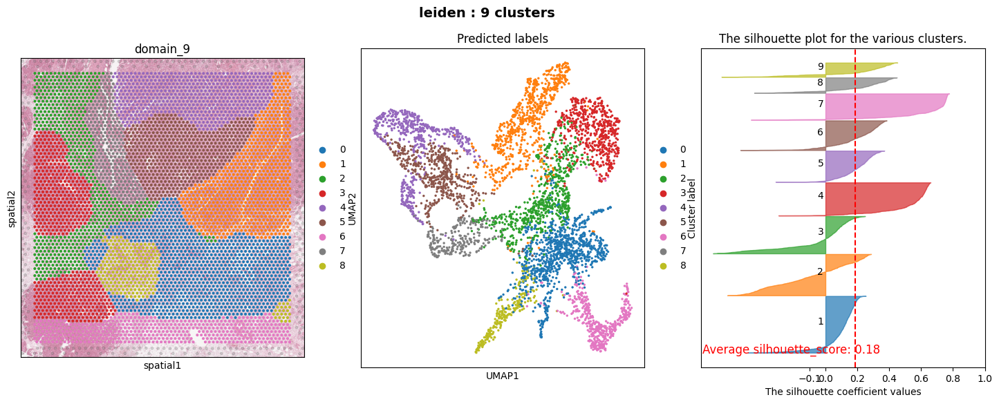

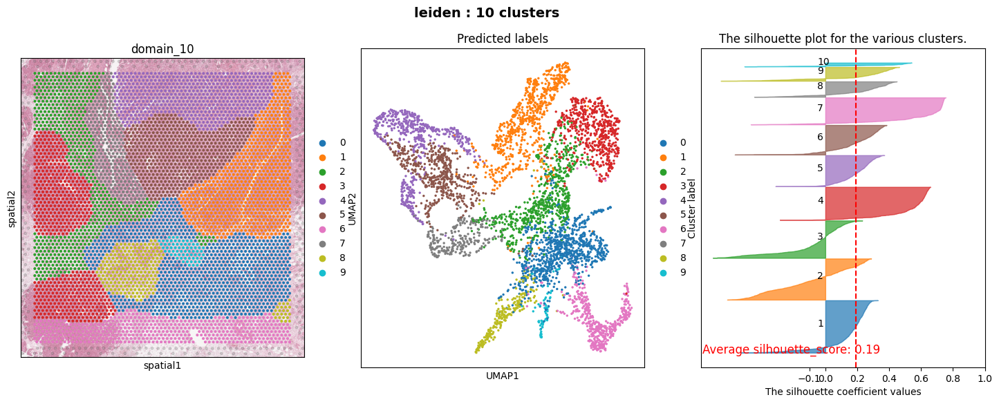

In [7]:
n_cluster_loop(adata, ['mclust','louvain', 'leiden'], list(range(2,11)), refinement=True, filename='GraphST_mclust_louvain_wth_refinement.pdf')